In [1]:
import numpy as np
import scipy.integrate
import bokeh.io
import bokeh.plotting
from bokeh.plotting import show
import panel as pn
import colorcet
bokeh.io.output_notebook()
pn.extension()
from ddeint import ddeint
from bokeh.layouts import row
import bokeh.palettes
from bokeh.models import (BasicTicker, ColorBar, ColumnDataSource,
                          LinearColorMapper, PrintfTickFormatter,)
from bokeh.transform import transform
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm, Normalize

Loading BokehJS ...

In [2]:
t_max = 100000
n=10000

w = 800
h = 300

In [3]:
# Initial concentrations with '#' are estimated
D_r_0 = 1
Cd_r_0 = 0
Nd_r_0 = 0
m_r_0 = 0
Cm_r_0 = 0
Nm_r_0 = 0
Ym_r_0 = 0
P_r_0 = 0
D_g_0 = 1
Cd_g_0 = 0
Nd_g_0 = 0
m_g_0 = 0
Cm_g_0 = 0
Nm_g_0 = 0
Ym_g_0 = 0
P_g_0 = 0
Pol_0 = 100000
R_0 = 10000
X_0 = 10000 #

D_3_0 = 1
Cd_3_0 = 0
Nd_3_0 = 0
mi3_0 = 0
K_0 = 0
L3C_0 = 0
Y3C_0 = 0
L3m_0 = 0
Y3m_0 = 0

D_5_0 = 1
Cd_5_0 = 0
Nd_5_0 = 0
K_0 = 0
mi5_0 = 0
L5_0 = 0
Y5_0 = 0

In [4]:
#   Rates with '#' are estimated 
km_p_0 = 0.1 #
km_m_0 = 0.1 #
km_0 = 0.1 #
km_c_0 = 0.085
kd_p_0 = 0.1 #
kd_m_0 = 0.1 #
kd_0 = 0.1 #
kd_c_0 = 0.085
km_X_0 = 0.01 #
km_d_0 = 0.085 #
lam_P_0 = 0.00025
lam_mi_0 = 0.0025

kbind_0 = 0.1 #
kdeg_0 = 0.085 #
beta_0 = 0.1

kX_3_0 = 1

kX_5_0 = 1

# --------------------------------------------- No Regulation ---------------------------------------------

In [5]:
def transcription_and_translation(D, Cd, Nd, m, Cm, Nm, Ym, P, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma):
    #DNA:   --------1a----------,  --1b--,
    dD_dt = -D*Pol*kd_p + Cd*kd_m + Cd*kd
    
    #dIniC: --------1a----------, ---1b--,
    dCd_dt = D*Pol*kd_p - Cd*kd_m - Cd*kd
    
    #dEloC: --1b--, ---1c---
    dNd_dt = Cd*kd - Nd*kd_c
    
    #Pol:     --------1a----------, ---1c---
    dPol_dt = -D*Pol*kd_p + Cd*kd_m + Nd*kd_c
    
    #mRNA:  ---1c-, -------2----------, --3--, ---5---, 
    dm_dt = Nd*kd_c  -m*R*km_p + Cm*km_m + Cm*km -m*X*km_X
    
    #mIniC: ------2----------, --3--,
    dCm_dt = m*R*km_p - Cm*km_m - Cm*km
    
    #mEloC: --3--, --4---,  ------5-------,
    dNm_dt = Cm*km - Nm*km_c -gamma*m*X*km_X
    
    #Prot:  ---4--, ---7----
    dP_dt = Nm*km_c - lam_P*P
    
    #Rib:   ------1-----------, ---4--,  ------6--------
    dR_dt = -m*R*km_p + Cm*km_m + Nm*km_c  + gamma*Ym*km_d
    
    #Exo:   ----5----, ---6---
    dX_dt = -m*X*km_X +Ym*km_d
    
    #m-X:    ----5----, ---6---
    dYm_dt = m*X*km_X - Ym*km_d
    
    return np.array([dD_dt, dCd_dt, dNd_dt, dm_dt, dCm_dt, dNm_dt, dYm_dt, dP_dt, dPol_dt, dR_dt, dX_dt])

In [6]:
def transcription_or_translation(target, machinery, initiation, elongation, product, kp, km, k, kc):
    #             1a-----------------,  1a---------------,  1b--------------
    dtarget_dt = -target*machinery*kp   +   initiation*km   +   initiation*k
    
    #               1a------------------,  1a---------------,  1c---------------
    dmachinery_dt = -target*machinery*kp   +   initiation*km   +   elongation*kc
    
    #                1a-----------------,  1b---------------,  1c--------------
    dinitiation_dt = target*machinery*kp   -   initiation*km   -   initiation*k
    
    #                1c----------,  1c---------------
    delongation_dt = initiation*k   -   elongation*kc
    
    #             1c-----------
    dproduct_dt = elongation*kc
    
    return np.array([dtarget_dt, dmachinery_dt, dinitiation_dt, delongation_dt, dproduct_dt])

In [7]:
def transcription_and_translation(D, Cd, Nd, m, Cm, Nm, Ym, P, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma):
    dD_dt, dPol_dt, dCd_dt, dNd_dt, dm_dt_1 = transcription_or_translation(D, Pol, Cd, Nd, m, kd_p, kd_m, kd, kd_c)
    dm_dt_2, dR_dt_1, dCm_dt, dNm_dt_1, dP_dt_1 = transcription_or_translation(m, R, Cm, Nm, P, km_p, km_m, km, km_c)
    
    dm_dt_3 = -m*X*km_X
    dX_dt = -m*X*km_X + Ym*kd
    dYm_dt = m*X*km_X - Ym*kd
    dNm_dt_2 = -gamma*m*X*km_X
    dR_dt_2 = gamma*Ym*kd
    
    dP_dt_2 = -lam_P*P

    return np.array([dD_dt, dCd_dt, dNd_dt, dm_dt_1+dm_dt_2+dm_dt_3, dCm_dt, dNm_dt_1+dNm_dt_2, dYm_dt, dP_dt_1+dP_dt_2, dPol_dt, dR_dt_1+dR_dt_2, dX_dt])

In [8]:
def model(y, t, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P):
    D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X = y
#     gamma_r = 0
#     gamma_g = 0
#     if m_r and Cm_r:
#         gamma_r = Nm_r/(Cm_r+m_r)
#     if m_g and Cm_g:
#         gamma_g = Nm_g/(Cm_g+m_g)
    gamma_r = Nm_r/(Cm_r+m_r+0.00000000000000001)  
    gamma_g = Nm_g/(Cm_g+m_g+0.00000000000000001)
    dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dPol_r_dt, dR_r_dt, dX_r_dt = transcription_and_translation(D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma_r)
    dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dPol_g_dt, dR_g_dt, dX_g_dt = transcription_and_translation(D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma_g)
    
    dPol_dt = dPol_r_dt + dPol_g_dt 
    dR_dt = dR_r_dt + dR_g_dt
    dX_dt = dX_r_dt + dX_g_dt
    return np.array([dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dPol_dt, dR_dt, dX_dt])

def model_calc(t_max, n, initial_values, args):
    t = np.linspace(0, t_max, n)    
    out = scipy.integrate.odeint(model, initial_values, t, args=args)
    D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X = out.transpose() 
    return t, D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X

In [9]:
initial_values = [D_r_0, Cd_r_0, Nd_r_0, m_r_0, Cm_r_0, Nm_r_0, Ym_r_0, P_r_0, D_g_0, Cd_g_0, Nd_g_0, m_g_0, Cm_g_0, Nm_g_0, Ym_g_0, P_g_0, Pol_0, R_0, X_0]
args =  km_p_0, km_m_0, km_0, km_c_0, kd_p_0, kd_m_0, kd_0, kd_c_0, km_X_0, km_d_0, lam_P_0

In [10]:
t, D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X = model_calc(t_max, n, initial_values, args)

p1_1 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='DNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_1.line(t, D_r+Cd_r, color = 'red', line_width = 3, legend_label = "Total - RFP", line_dash = "dashed")
p1_1.line(t, D_r, color = 'red', line_width = 3, legend_label = "Free - RFP")
p1_1.line(t, D_g+Cd_g, color = 'green', line_width = 3, legend_label = "Total - GFP", line_dash = "dashed")
p1_1.line(t, D_g, color = 'green', line_width = 3, legend_label = "Free - GFP")

p1_2 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Bound DNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_2.line(t, Cd_r, color = 'red', line_width = 3, legend_label = "Ini. com. - RFP")
p1_2.line(t, Nd_r, color = 'red', line_width = 3, legend_label = "Elo. com. - RFP", line_dash = "dashed")
p1_2.line(t, Cd_g, color = 'green', line_width = 3, legend_label = "Ini. com. - GFP")
p1_2.line(t, Nd_g, color = 'green', line_width = 3, legend_label = "Elo. com. - GFP", line_dash = "dashed")

p1_3 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='RNA Polymerase', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_3.line(t, Pol, color = 'blue', legend_label = "Free", line_width = 3)
          
p1_4 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_4.line(t, m_r+Cm_r, color = 'red', line_width = 3, legend_label = "Total - RFP", line_dash = "dashed")
p1_4.line(t, m_r, color = 'red', line_width = 3, legend_label = "Free - RFP")
p1_4.line(t, m_g+Cm_g, color = 'green', line_width = 3, legend_label = "Total - GFP", line_dash = "dashed")
p1_4.line(t, m_g, color = 'green', line_width = 3, legend_label = "Free - GFP")

p1_5 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Bound mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_5.line(t, Cm_r, color = 'red', line_width = 3, legend_label = "Ini. com. - RFP")
p1_5.line(t, Nm_r, color = 'red', line_width = 3, legend_label = "Elo. com. - RFP", line_dash = "dashed")
p1_5.line(t, Cm_g, color = 'green', line_width = 3, legend_label = "Ini. com. - GFP")
p1_5.line(t, Nm_g, color = 'green', line_width = 3, legend_label = "Elo. com. - GFP", line_dash = "dashed")

p1_6 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Protein', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_6.line(t, P_r, color = 'red', legend_label = "Protein. - RFP", line_width = 3)
p1_6.line(t, P_g, color = 'green', legend_label = "Protein. - GFP", line_width = 3)

p1_7 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Ribosome', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_7.line(t, R, color = 'blue', legend_label = "Free", line_width = 3)

p1_8 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Exoribonuclease', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_8.line(t, X, color = 'blue', legend_label = "Free", line_width = 3)

p1_9 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Background degrading mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_9.line(t, Ym_r, color = 'red', legend_label = "RFP", line_width = 3)
p1_9.line(t, Ym_g, color = 'green', legend_label = "GFP", line_width = 3)




GlyphRenderer(id='1669', ...)

In [11]:
show(p1_1)
show(p1_2)
show(p1_3)
show(p1_4)
show(p1_5)
show(p1_6)
print("RFP Protein final conc: ",P_r[-1])
print("GFP Protein final conc: ",P_g[-1])
show(p1_7)
show(p1_8)
show(p1_9)

RFP Protein final conc:  1615.4269217795659
GFP Protein final conc:  1615.426921779566


# --------------------------------------------- 3' Regulation ---------------------------------------------

In [12]:
def miRNA_binding(target, miRNA, Nm, kb, gamma):
    
    dtarget_dt = -target*miRNA*kb
    dmiRNA_dt = -target*miRNA*kb
    dNm_dt = -gamma*target*miRNA*kb
    
    dL_dt = target*miRNA*kb
    dK_dt = gamma*target*miRNA*kb
   
    return np.array([dtarget_dt, dmiRNA_dt, dNm_dt, dL_dt, dK_dt])

In [13]:
def miRNA_degradation(target, X, K, zeta, kX, kd1, kd2, Y, R, initiation):
    
    dtarget_dt = -target*X*kX
    dX_dt = -target*X*kX + Y*kd1 + Y*kd2
    dY_dt = target*X*kX - Y*kd1 - Y*kd2
    dK_dt = -zeta*target*X*kX
    
    if initiation:
        zeta += 1
        
    dR_dt = zeta*Y*kd1 + zeta*Y*kd2
    dmiRNA_dt = Y*kd2
        
    
    return np.array([dtarget_dt, dX_dt, dY_dt, dK_dt, dR_dt, dmiRNA_dt])

In [14]:
def three_miRNA_regulation(m, C, mi3, Nm, Lm, Ym, LC, YC, K, R, P, X, kb, kX, kd, kp, km, k, kc, gamma, beta):
    
    kd1 = (1-beta)*kd
    kd2 = beta*kd     #recycle
    zeta = 0
    
#     if Lm or LC:
#         zeta = K/(Lm+LC)
    zeta = K/(Lm+LC+0.00000000000000001)
    
    dm_dt, dmi3_dt_1, dNm_dt_1, dLm_dt_1, dK_dt_1  = miRNA_binding(m, mi3, Nm, kb, gamma)
    dCm_dt, dmi3_dt_2, dNm_dt_2, dLC_dt_1, dK_dt_2  = miRNA_binding(C, mi3, Nm, kb, gamma)
    
    dLm_dt_2, dR_dt_1, dLC_dt_2, dK_dt_3, dP_dt =  transcription_or_translation(Lm, R, LC, K, P, kp, km, k, kc)
    
    dLm_dt_3, dX_dt_1, dYm_dt, dK_dt_4, dR_dt_2, dmi3_dt_3 =  miRNA_degradation(Lm, X, K, zeta, kX, kd1, kd2, Ym, R, False)
    dLC_dt_3, dX_dt_2, dYC_dt, dK_dt_5, dR_dt_3, dmi3_dt_4 =  miRNA_degradation(LC, X, K, zeta, kX, kd1, kd2, YC, R, True)
    
    
    dmi3_dt = dmi3_dt_1 + dmi3_dt_2 + dmi3_dt_3 + dmi3_dt_4
    dNm_dt = dNm_dt_1 + dNm_dt_2
    dLm_dt = dLm_dt_1 + dLm_dt_2 + dLm_dt_3
    dLC_dt = dLC_dt_1 + dLC_dt_2 + dLC_dt_3
    dK_dt = dK_dt_1 + dK_dt_2 + dK_dt_3 + dK_dt_4 + dK_dt_5
    dR_dt = dR_dt_1 + dR_dt_2 + dR_dt_3
    dX_dt = dX_dt_1 + dX_dt_2
    
    return np.array([dm_dt, dCm_dt, dmi3_dt, dNm_dt, dLm_dt, dLC_dt, dYm_dt, dYC_dt, dK_dt, dR_dt, dX_dt, dP_dt])

In [15]:
def model_3(y, t, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, lam_3, kbind, kX, kdeg, beta):
    D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_3, Cd_3, Nd_3, mi3, K, L3C, Y3C, L3m, Y3m, Pol, R, X = y
#     gamma_r = 0
#     gamma_g = 0
#     if m_r or Cm_r:
#         gamma_r = Nm_r/(Cm_r+m_r)
#     if m_g or Cm_g:
#         gamma_g = Nm_g/(Cm_g+m_g)
    gamma_r = Nm_r/(Cm_r+m_r+0.00000000000000001)  
    gamma_g = Nm_g/(Cm_g+m_g+0.00000000000000001)
    dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dPol_r_dt, dR_r_dt, dX_r_dt = transcription_and_translation(D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma_r)
    dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dPol_g_dt, dR_g_dt, dX_g_dt = transcription_and_translation(D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma_g)
    dD_3_dt, dCd_3_dt, dNd_3_dt, dmi3_dt, _, _, _, _, dPol_3_dt, _, _ = transcription_and_translation(D_3, Cd_3, Nd_3, mi3, 0, 0, 0, 0, Pol, 0, 0, 0, 0, 0, 0, kd_p, kd_m, kd, kd_c, 0, 0, 0, 0)
    
    dmi3_dt += -lam_3*mi3
    dm_r_3reg_dt, dCm_r_3reg_dt, dmi3_3reg_dt, dNm_r_3reg_dt, dL3m_dt, dL3C_dt, dY3m_dt, dY3C_dt, dK_dt, dR_3reg_dt, dX_3reg_dt, dP_r_3reg_dt = three_miRNA_regulation(m_r, Cm_r, mi3, Nm_r, L3m, Y3m, L3C, Y3C, K, R, P_r, X, kbind, kX, kdeg, km_p, km_m, km, km_c, gamma_r, beta)
    
    
    
    
    dm_r_dt += dm_r_3reg_dt
    dCm_r_dt += dCm_r_3reg_dt
    dNm_r_dt += dNm_r_3reg_dt
    
    dmi3_dt += dmi3_3reg_dt 
    
    dPol_dt = dPol_r_dt + dPol_g_dt + dPol_3_dt
    dR_dt = dR_r_dt + dR_g_dt + dR_3reg_dt
    dX_dt = dX_r_dt + dX_g_dt + dX_3reg_dt
    
    dP_r_dt += dP_r_3reg_dt
    
    
    return np.array([dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dD_3_dt, dCd_3_dt, dNd_3_dt, dmi3_dt, dK_dt, dL3C_dt, dY3C_dt, dL3m_dt, dY3m_dt, dPol_dt, dR_dt, dX_dt])

def model_calc_3(t_max, n, initial_values, args):
    t = np.linspace(0, t_max, n)    
    out = scipy.integrate.odeint(model_3, initial_values, t, args=args)
    D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_3, Cd_3, Nd_3, mi3, K, L3C, Y3C, L3m, Y3m, Pol, R, X = out.transpose() 
    return t, D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_3, Cd_3, Nd_3, mi3, K, L3C, Y3C, L3m, Y3m, Pol, R, X

In [16]:
# Initial values:  D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_3, Cd_3, Nd_3, mi3, K, L3C, Y3C, L3m, Y3m,  Pol,    R,  X
initial_values = [  D_r_0, Cd_r_0, Nd_r_0, m_r_0, Cm_r_0, Nm_r_0, Ym_r_0, P_r_0, D_g_0, Cd_g_0, Nd_g_0, m_g_0, Cm_g_0, Nm_g_0, Ym_g_0, P_g_0, D_3_0, Cd_3_0, Nd_3_0, mi3_0, K_0, L3C_0, Y3C_0, L3m_0, Y3m_0,  Pol_0,    R_0,  X_0]
# Rates: km_p, km_m, km,  km_c, kd_p, kd_m, kd, kd_c, km_X, km_d,   lam_P, lam_3, kbind, kX_r, kdeg, beta
args = km_p_0, km_m_0, km_0,  km_c_0, kd_p_0, kd_m_0, kd_0, kd_c_0, km_X_0, km_d_0,   lam_P_0, lam_mi_0, kbind_0, kX_3_0, kdeg_0, beta_0

In [17]:
t, D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_3, Cd_3, Nd_3, mi3, K, L3C, Y3C, L3m, Y3m, Pol, R, X = model_calc_3(t_max, n, initial_values, args)

p1_1 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='DNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_1.line(t, D_r+Cd_r, color = 'red', line_width = 3, legend_label = "Total - RFP", line_dash = "dashed")
p1_1.line(t, D_r, color = 'red', line_width = 3, legend_label = "Free - RFP")
p1_1.line(t, D_g+Cd_g, color = 'green', line_width = 3, legend_label = "Total - GFP", line_dash = "dashed")
p1_1.line(t, D_g, color = 'green', line_width = 3, legend_label = "Free - GFP")
p1_1.line(t, D_3+Cd_3, color = 'purple', line_width = 3, legend_label = "Total - miRNA 3'", line_dash = "dashed")
p1_1.line(t, D_3, color = 'purple', line_width = 3, legend_label = "Free - miRNA 3'")

p1_2 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Bound DNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_2.line(t, Cd_r, color = 'red', line_width = 3, legend_label = "Ini. com. - RFP")
p1_2.line(t, Nd_r, color = 'red', line_width = 3, legend_label = "Elo. com. - RFP", line_dash = "dashed")
p1_2.line(t, Cd_g, color = 'green', line_width = 3, legend_label = "Ini. com. - GFP")
p1_2.line(t, Nd_g, color = 'green', line_width = 3, legend_label = "Elo. com. - GFP", line_dash = "dashed")
p1_2.line(t, Cd_3, color = 'purple', line_width = 3, legend_label = "Ini. com. - miRNA 3'")
p1_2.line(t, Nd_3, color = 'purple', line_width = 3, legend_label = "Elo. com. - miRNA 3'", line_dash = "dashed")

p1_3 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='RNA Polymerase', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_3.line(t, Pol, color = 'blue', legend_label = "Free", line_width = 3)
          
p1_4 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_4.line(t, m_r+Cm_r, color = 'red', line_width = 3, legend_label = "Total - RFP", line_dash = "dashed")
p1_4.line(t, m_r, color = 'red', line_width = 3, legend_label = "Free - RFP")
p1_4.line(t, m_g+Cm_g, color = 'green', line_width = 3, legend_label = "Total - GFP", line_dash = "dashed")
p1_4.line(t, m_g, color = 'green', line_width = 3, legend_label = "Free - GFP")
p1_4.line(t, mi3, color = 'purple', line_width = 3, legend_label = "Free - miRNA 3'")

p1_5 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Bound mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_5.line(t, Cm_r, color = 'red', line_width = 3, legend_label = "Ini. com. - RFP")
p1_5.line(t, Nm_r, color = 'red', line_width = 3, legend_label = "Elo. com. - RFP", line_dash = "dashed")
p1_5.line(t, Cm_g, color = 'green', line_width = 3, legend_label = "Ini. com. - GFP")
p1_5.line(t, Nm_g, color = 'green', line_width = 3, legend_label = "Elo. com. - GFP", line_dash = "dashed")

p1_6 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Protein', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_6.line(t, P_r, color = 'red', legend_label = "Protein. - RFP", line_width = 3)
p1_6.line(t, P_g, color = 'green', legend_label = "Protein. - GFP", line_width = 3)#

p1_7 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Ribosome', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_7.line(t, R, color = 'blue', legend_label = "Free", line_width = 3)

p1_8 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Exoribonuclease', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_8.line(t, X, color = 'blue', legend_label = "Free", line_width = 3)

p1_9 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Background degrading mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_9.line(t, Ym_r, color = 'red', legend_label = "RFP", line_width = 3)
p1_9.line(t, Ym_g, color = 'green', legend_label = "GFP", line_width = 3)

p1_10 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='miRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_10.line(t, mi3, color = 'purple', legend_label = "Free", line_width = 3)

p1_11 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='miRNA Degegradation initiation complex', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_11.line(t, L3C, color = 'red', legend_label = "Deg. ini. mRNA", line_width = 3)
p1_11.line(t, L3m, color = 'red', legend_label = "Deg. ini. mRNA trans. ini. comp. ", line_width = 3, line_dash = "dashed")

p1_12 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='miRNA Degegradation elongation complex', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_12.line(t, Y3C, color = 'red', legend_label = "Deg. elo. mRNA", line_width = 3)
p1_12.line(t, Y3m, color = 'red', legend_label = "Deg. elo. mRNA trans. ini. comp.", line_width = 3, line_dash = "dashed")



GlyphRenderer(id='3679', ...)

In [18]:
show(p1_1)
show(p1_2)
show(p1_3)
show(p1_4)
print("RFP mRNA final conc: ",m_r[-1]+Cm_r[-1])
print("GFP mRNA final conc: ",m_g[-1]+Cm_g[-1])
show(p1_5)
show(p1_6)
print("RFP Protein final conc: ",P_r[-1])
print("GFP Protein final conc: ",P_g[-1])
show(p1_7)
show(p1_8)
show(p1_9)
show(p1_10)
show(p1_11)
show(p1_12)

RFP mRNA final conc:  0.11111113045031737
GFP mRNA final conc:  4.995920999752887


RFP Protein final conc:  3.8318492412476703
GFP Protein final conc:  1617.1575976633944


# --------------------------------------------- 5' Regulation ---------------------------------------------

In [19]:
def five_miRNA_regulation(m, N, mi5, L, Y, K, R, X, kb, kX, kd, kc, beta, gamma):
    
    kd1 = (1-beta)*kd
    kd2 = beta*kd     #recycle
#     zeta = 0
    
#     if L:
#         zeta = K/L
    zeta = K/(L+0.00000000000000001)
    dm_dt, dmi5_dt_1, dNm_dt, dL_dt_1, dK_dt_1 = miRNA_binding(m, mi5, N, kb, gamma)
    
 

    
    dL_dt_2, dX_dt, dY_dt, dK_dt_2, dR_dt, dmi5_dt_2 = miRNA_degradation(L, X, K, zeta, kX, kd1, kd2, Y, R, False)
        
    dmi5_dt = dmi5_dt_1 + dmi5_dt_2
    dL_dt = dL_dt_1 + dL_dt_2
    dK_dt = dK_dt_1 + dK_dt_2 - K*kc
    
    dR_dt += K*kc
    dP_dt = K*kc
    
    
    return np.array([dm_dt, dNm_dt, dmi5_dt, dL_dt, dY_dt, dK_dt, dR_dt, dX_dt, dP_dt])

In [20]:
def model_5(y, t, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, lam_5, kbind, kX, kdeg, beta):
    D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_5, Cd_5, Nd_5, K, mi5, L5, Y5, Pol, R, X = y
#     gamma_r = 0
#     gamma_g = 0
#     if m_r and Cm_r:
#         gamma_r = Nm_r/(Cm_r+m_r)
#     if m_g and Cm_g:
#         gamma_g = Nm_g/(Cm_g+m_g)
    gamma_r = Nm_r/(Cm_r+m_r+0.00000000000000001)  
    gamma_g = Nm_g/(Cm_g+m_g+0.00000000000000001)
    dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dPol_r_dt, dR_r_dt, dX_r_dt = transcription_and_translation(D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma_r)
    dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dPol_g_dt, dR_g_dt, dX_g_dt = transcription_and_translation(D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, gamma_g)
    dD_5_dt, dCd_5_dt, dNd_5_dt, dmi5_dt, _, _, _, _, dPol_5_dt, _, _ = transcription_and_translation(D_5, Cd_5, Nd_5, mi5, 0, 0, 0, 0, Pol, 0, 0, 0, 0, 0, 0, kd_p, kd_m, kd, kd_c, 0, 0, 0, 0)
    
    dmi5_dt += -lam_5*mi5
    
    dm_r_5reg_dt, dNm_r_5reg_dt, dmi5_5reg_dt, dL5_dt, dY5_dt, dK_dt, dR_5reg_dt, dX_5reg_dt, dP_5reg_dt = five_miRNA_regulation(m_r, Nm_r, mi5, L5, Y5, K, R, X, kbind, kX, kdeg, km_c, beta, gamma_r)
    
    dm_r_dt += dm_r_5reg_dt
    dNm_r_dt += dNm_r_5reg_dt
    dP_r_dt += dP_5reg_dt
    dmi5_dt += dmi5_5reg_dt
    
    dPol_dt = dPol_r_dt + dPol_g_dt + dPol_5_dt
    dR_dt = dR_r_dt + dR_g_dt + dR_5reg_dt
    dX_dt = dX_r_dt + dX_g_dt + dX_5reg_dt
    return np.array([dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dD_5_dt, dCd_5_dt, dNd_5_dt, dK_dt, dmi5_dt, dL5_dt, dY5_dt, dPol_dt, dR_dt, dX_dt])

def model_calc_5(t_max, n, initial_values, args):
    t = np.linspace(0, t_max, n)    
    out = scipy.integrate.odeint(model_5, initial_values, t, args=args)
    D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_5, Cd_5, Nd_5, K, mi5, L5, Y5, Pol, R, X = out.transpose() 
    return t, D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_5, Cd_5, Nd_5, K, mi5, L5, Y5, Pol, R, X

In [21]:
# Initial values:  D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_5, Cd_5, Nd_5, K, mi5, L5, Y5, Pol,    R,  X
initial_values = [   D_r_0, Cd_r_0, Nd_r_0, m_r_0, Cm_r_0, Nm_r_0, Ym_r_0, P_r_0, D_g_0, Cd_g_0, Nd_g_0, m_g_0, Cm_g_0, Nm_g_0, Ym_g_0, P_g_0, D_5_0, Cd_5_0, Nd_5_0, K_0, mi5_0, L5_0, Y5_0, Pol_0,    R_0,  X_0]
# Rates: km_p, km_m, km,  km_c, kd_p, kd_m, kd, kd_c, km_X, km_d,   lam_P, lam_5, kbind, kX_r, kdeg, beta


In [22]:
t, D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, D_5, Cd_5, Nd_5, K, mi5, L5, Y5, Pol, R, X = model_calc_5(t_max, n, initial_values, args)

p1_1 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='DNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_1.line(t, D_r+Cd_r, color = 'red', line_width = 3, legend_label = "Total - RFP", line_dash = "dashed")
p1_1.line(t, D_r, color = 'red', line_width = 3, legend_label = "Free - RFP")
p1_1.line(t, D_g+Cd_g, color = 'green', line_width = 3, legend_label = "Total - GFP", line_dash = "dashed")
p1_1.line(t, D_g, color = 'green', line_width = 3, legend_label = "Free - GFP")
p1_1.line(t, D_5+Cd_3, color = 'purple', line_width = 3, legend_label = "Total - miRNA 5'", line_dash = "dashed")
p1_1.line(t, D_5, color = 'purple', line_width = 3, legend_label = "Free - miRNA 5'")

p1_2 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Bound DNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_2.line(t, Cd_r, color = 'red', line_width = 3, legend_label = "Ini. com. - RFP")
p1_2.line(t, Nd_r, color = 'red', line_width = 3, legend_label = "Elo. com. - RFP", line_dash = "dashed")
p1_2.line(t, Cd_g, color = 'green', line_width = 3, legend_label = "Ini. com. - GFP")
p1_2.line(t, Nd_g, color = 'green', line_width = 3, legend_label = "Elo. com. - GFP", line_dash = "dashed")
p1_2.line(t, Cd_5, color = 'purple', line_width = 3, legend_label = "Ini. com. - miRNA 5'")
p1_2.line(t, Nd_5, color = 'purple', line_width = 3, legend_label = "Elo. com. - miRNA 5'", line_dash = "dashed")

p1_3 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='RNA Polymerase', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_3.line(t, Pol, color = 'blue', legend_label = "Free", line_width = 3)
          
p1_4 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_4.line(t, m_r+Cm_r, color = 'red', line_width = 3, legend_label = "Total - RFP", line_dash = "dashed")
p1_4.line(t, m_r, color = 'red', line_width = 3, legend_label = "Free - RFP")
p1_4.line(t, m_g+Cm_g, color = 'green', line_width = 3, legend_label = "Total - GFP", line_dash = "dashed")
p1_4.line(t, m_g, color = 'green', line_width = 3, legend_label = "Free - GFP")
p1_4.line(t, mi5, color = 'purple', line_width = 3, legend_label = "Free - miRNA 5'")

p1_5 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Bound mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_5.line(t, Cm_r, color = 'red', line_width = 3, legend_label = "Ini. com. - RFP")
p1_5.line(t, Nm_r, color = 'red', line_width = 3, legend_label = "Elo. com. - RFP", line_dash = "dashed")
p1_5.line(t, Cm_g, color = 'green', line_width = 3, legend_label = "Ini. com. - GFP")
p1_5.line(t, Nm_g, color = 'green', line_width = 3, legend_label = "Elo. com. - GFP", line_dash = "dashed")

p1_6 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Protein', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_6.line(t, P_r, color = 'red', legend_label = "Protein. - RFP", line_width = 3)
p1_6.line(t, P_g, color = 'green', legend_label = "Protein. - GFP", line_width = 3)

p1_7 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Ribosome', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_7.line(t, R, color = 'blue', legend_label = "Free", line_width = 3)

p1_8 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Exoribonuclease', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_8.line(t, X, color = 'blue', legend_label = "Free", line_width = 3)

p1_9 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='Background degrading mRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_9.line(t, Ym_r, color = 'red', legend_label = "RFP", line_width = 3)
p1_9.line(t, Ym_g, color = 'green', legend_label = "GFP", line_width = 3)

p1_10 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='miRNA', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_10.line(t, mi3, color = 'purple', legend_label = "Free", line_width = 3)

p1_11 = bokeh.plotting.figure(frame_width=w, frame_height=h, title='miRNA Degegradation complexes', x_axis_label="time", y_axis_label="magnitude", x_range=[0, t_max])
p1_11.line(t, L5, color = 'red', legend_label = "Deg. ini. mRNA", line_width = 3)
p1_11.line(t, Y5, color = 'red', legend_label = "Deg. elo. mRNA ", line_width = 3, line_dash = "dashed")



GlyphRenderer(id='7479', ...)

In [23]:
show(p1_1)
show(p1_2)
show(p1_3)
show(p1_4)
print("RFP mRNA final conc: ",m_r[-1]+Cm_r[-1])
print("GFP mRNA final conc: ",m_g[-1]+Cm_g[-1])
show(p1_5)
show(p1_6)
print("RFP Protein final conc: ",P_r[-1])
print("GFP Protein final conc: ",P_g[-1])
show(p1_7)
show(p1_8)
show(p1_9)
show(p1_10)
show(p1_11)
show(p1_12)

RFP mRNA final conc:  4.805804262015623
GFP mRNA final conc:  4.991629339877327


RFP Protein final conc:  1543.975832418729
GFP Protein final conc:  1615.5033965831044


# ----------------------------------------- Sensitivity Analysis -----------------------------------------

In [24]:
from sympy import *
from sympy.utilities.lambdify import lambdify, implemented_function

In [25]:
D_r, Cd_r, Nd_r, m_r, Ym_r, Cm_r, Nm_r, P_r = symbols('D_r, Cd_r, Nd_r, m_r, Ym_r, Cm_r, Nm_r, P_r')
D_g, Cd_g, Nd_g, m_g, Ym_g, Cm_g, Nm_g, P_g = symbols('D_g, Cd_g, Nd_g, m_g, Ym_g, Cm_g, Nm_g, P_g')
D_3, Cd_3, Nd_3, mi_3, K_3, LC_3, Lm_3, YC_3, Ym_3 = symbols('D_3, Cd_3, Nd_3, mi_3, K_3, LC_3, Lm_3, YC_3, Ym_3')
D_5, Cd_5, Nd_5, mi_5, K_5, L_5, Y_5 = symbols('D_5, Cd_5, Nd_5, mi_5, K_5, L_5, Y_5')
Pol, R, X = symbols('Pol, R, X')

In [26]:
S_D_r, S_Cd_r, S_Nd_r, S_m_r, S_Ym_r, S_Cm_r, S_Nm_r, S_P_r = symbols('S_D_r, S_Cd_r, S_Nd_r, S_m_r, S_Ym_r, S_Cm_r, S_Nm_r, S_P_r')
S_D_g, S_Cd_g, S_Nd_g, S_m_g, S_Ym_g, S_Cm_g, S_Nm_g, S_P_g = symbols('S_D_g, S_Cd_g, S_Nd_g, S_m_g, S_Ym_g, S_Cm_g, S_Nm_g, S_P_g')
S_D_3, S_Cd_3, S_Nd_3, S_mi_3, S_K_3, S_LC_3, S_Lm_3, S_YC_3, S_Ym_3 = symbols('S_D_3, S_Cd_3, S_Nd_3, S_mi_3, S_K_3, S_LC_3, S_Lm_3, S_YC_3, S_Ym_3')
S_D_5, S_Cd_5, S_Nd_5, S_mi_5, S_K_5, S_L_5, S_Y_5 = symbols('S_D_5, S_Cd_5, S_Nd_5, S_mi_5, S_K_5, S_L_5, S_Y_5')
S_Pol, S_R, S_X = symbols('S_Pol, S_R, S_X')

In [27]:
km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, lam_m, kbind, kdeg, beta, kX_3, kX_5 = symbols("km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P, lam_m, kbind, kdeg, beta, kX_3, kX_5")

### ---------------------------------------------------------------------- No Regulation ----------------------------------------------------------------------

In [28]:
y = D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X
t = 0
dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dPol_dt, dR_dt, dX_dt = model(y, t, km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P)

In [111]:
small = 1e-30
rates = (km_p, km_m, km, km_c, kd_p, kd_m, kd, kd_c, km_X, km_d, lam_P)
rates_vals = km_p_0, km_m_0, km_0, km_c_0, kd_p_0, kd_m_0, kd_0, kd_c_0, km_X_0, km_d_0, lam_P_0
ODEs = Matrix([dD_r_dt, dCd_r_dt, dNd_r_dt, dm_r_dt, dCm_r_dt, dNm_r_dt, dYm_r_dt, dP_r_dt, dD_g_dt, dCd_g_dt, dNd_g_dt, dm_g_dt, dCm_g_dt, dNm_g_dt, dYm_g_dt, dP_g_dt, dPol_dt, dR_dt, dX_dt])
variables = (D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X)
variables_nonzero = (D_r+small, Cd_r+small, Nd_r+small, m_r+small, Cm_r+small, Nm_r+small, Ym_r+small, P_r+small, D_g+small, Cd_g+small, Nd_g+small, m_g+small, Cm_g+small, Nm_g+small, Ym_g+small, P_g+small, Pol+small, R+small, X+small)
variables_inv = Matrix([1/(D_r+small), 1/(Cd_r+small), 1/(Nd_r+small), 1/(m_r+small), 1/(Cm_r+small), 1/(Nm_r+small), 1/(Ym_r+small), 1/(P_r+small), 1/(D_g+small), 1/(Cd_g+small), 1/(Nd_g+small), 1/(m_g+small), 1/(Cm_g+small), 1/(Nm_g+small), 1/(Ym_g+small), 1/(P_g+small), 1/(Pol+small), 1/(R+small), 1/(X+small)])

sensitivities = (S_D_r, S_Cd_r, S_Nd_r, S_m_r, S_Cm_r, S_Nm_r, S_Ym_r, S_P_r, S_D_g, S_Cd_g, S_Nd_g, S_m_g, S_Cm_g, S_Nm_g, S_Ym_g, S_P_g, S_Pol, S_R, S_X)

In [45]:
S = Matrix(list(sensitivities))
f = ODEs
y = Matrix(list(variables))
P = list(rates)

In [46]:
Parameter = 0

ODEs_lam = lambdify(rates, ODEs)
ODEs_R = ODEs_lam(km_p_0, km_m_0, km_0, km_c_0, kd_p_0, kd_m_0, kd_0, kd_c_0, km_X_0, km_d_0, lam_P_0)
ODEs_R_lam = lambdify(variables, ODEs_R)

Para = P[Parameter]
J = f.jacobian(y)
F = Matrix(f.diff(Para))
dS_dt = J*S+F

dS_dt_lam = lambdify(rates, dS_dt)
dS_dt_R = dS_dt_lam(km_p_0, km_m_0, km_0, km_c_0, kd_p_0, kd_m_0, kd_0, kd_c_0, km_X_0, km_d_0, lam_P_0)
Sens_ODEs_lam = lambdify(variables + sensitivities, dS_dt_R)

In [47]:
def model(y, t, ODEs_R_lam, Sens_ODEs_lam, Para):
    D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X, S_D_r, S_Cd_r, S_Nd_r, S_m_r, S_Cm_r, S_Nm_r, S_Ym_r, S_P_r, S_D_g, S_Cd_g, S_Nd_g, S_m_g, S_Cm_g, S_Nm_g, S_Ym_g, S_P_g, S_Pol, S_R, S_X = y
    dY_dt = ODEs_R_lam(D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X)
    dS_dt = Sens_ODEs_lam(D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X, S_D_r, S_Cd_r, S_Nd_r, S_m_r, S_Cm_r, S_Nm_r, S_Ym_r, S_P_r, S_D_g, S_Cd_g, S_Nd_g, S_m_g, S_Cm_g, S_Nm_g, S_Ym_g, S_P_g, S_Pol, S_R, S_X)
    out = dY_dt + dS_dt    
    dS_dt
    return np.array([out[i][0] for i, j in enumerate(out)])
def model_calc(t_max, n, initial_values, ODEs_R_lam, Sens_ODEs_lam, Para):
    t = np.linspace(0, t_max, n)
    args = (ODEs_R_lam, Sens_ODEs_lam, Para)
    out = scipy.integrate.odeint(model, initial_values, t, args=args)
    return t, out

In [48]:
S_D_r_0 = 0
S_Cd_r_0 = 0
S_Nd_r_0 = 0
S_m_r_0 = 0
S_Cm_r_0 = 0
S_Nm_r_0 = 0
S_Ym_r_0 = 0
S_P_r_0 = 0
S_D_g_0 = 0
S_Cd_g_0 = 0
S_Nd_g_0 = 0
S_m_g_0 = 0
S_Cm_g_0 = 0
S_Nm_g_0 = 0
S_Ym_g_0 = 0
S_P_g_0 = 0
S_Pol_0 = 0
S_R_0 = 0
S_X_0 = 0

initial_values = [D_r_0, Cd_r_0, Nd_r_0, m_r_0, Cm_r_0, Nm_r_0, Ym_r_0, P_r_0, D_g_0, Cd_g_0, Nd_g_0, m_g_0, Cm_g_0, Nm_g_0, Ym_g_0, P_g_0, Pol_0, R_0, X_0, S_D_r_0, S_Cd_r_0, S_Nd_r_0, S_m_r_0, S_Cm_r_0, S_Nm_r_0, S_Ym_r_0, S_P_r_0, S_D_g_0, S_Cd_g_0, S_Nd_g_0, S_m_g_0, S_Cm_g_0, S_Nm_g_0, S_Ym_g_0, S_P_g_0, S_Pol_0, S_R_0, S_X_0]

In [49]:
# t, out = model_calc(t_max, n, initial_values, ODEs_R_lam, Sens_ODEs_lam)
# D_r, Cd_r, Nd_r, m_r, Cm_r, Nm_r, Ym_r, P_r, D_g, Cd_g, Nd_g, m_g, Cm_g, Nm_g, Ym_g, P_g, Pol, R, X, S_D_r, S_Cd_r, S_Nd_r, S_m_r, S_Cm_r, S_Nm_r, S_Ym_r, S_P_r, S_D_g, S_Cd_g, S_Nd_g, S_m_g, S_Cm_g, S_Nm_g, S_Ym_g, S_P_g, S_Pol, S_R, S_X = out.transpose()

In [114]:
Heatmap = np.zeros([11,19])
Heatmap_norm = np.zeros([11,19])
for i in range(11):
    ODEs_lam = lambdify(rates, ODEs)
    ODEs_R = ODEs_lam(km_p_0, km_m_0, km_0, km_c_0, kd_p_0, kd_m_0, kd_0, kd_c_0, km_X_0, km_d_0, lam_P_0)
    ODEs_R_lam = lambdify(variables, ODEs_R)
    Para = P[i]
    
    J = f.jacobian(y)
    F = Matrix(f.diff(Para))
#     dS_dt = J*S + S 
    dS_dt = J*S + hadamard_product(F,ODEs/Para) + hadamard_product(S,hadamard_product(ODEs,variables_inv))

    dS_dt_lam = lambdify(rates, dS_dt)
    dS_dt_R = dS_dt_lam(km_p_0, km_m_0, km_0, km_c_0, kd_p_0, kd_m_0, kd_0, kd_c_0, km_X_0, km_d_0, lam_P_0)
    Sens_ODEs_lam = lambdify(variables + sensitivities, dS_dt_R)
    print("fin")
    t, out = model_calc(t_max, n, initial_values, ODEs_R_lam, Sens_ODEs_lam, rates_vals[i])
    for j in range(19):
        Heatmap[i,j] = out[-1,j+19]
#         Heatmap_norm[i,j] = out[-1,j+19] *rates_vals[i]/out[-1,j]

fin
fin
fin
fin
fin
fin
fin
fin
fin
fin
fin


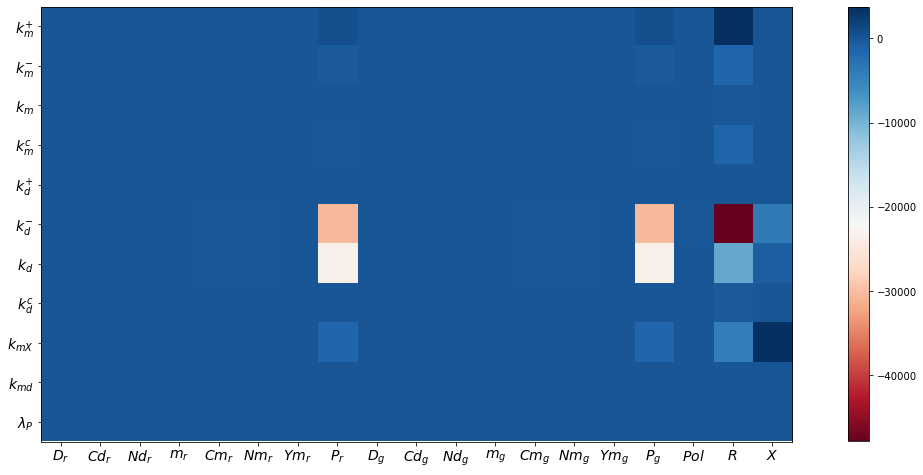

In [115]:
fig, ax = plt.subplots(figsize=(20, 8))
y_label_list = ['$k_{m}^{+}$', '$k_{m}^{-}$', '$k_m$', '$k_{m}^c$', '$k_{d}^{+}$', '$k_{d}^{-}$', '$k_d$', '$k_{d}^{c}$', '$k_{mX}$', '$k_{md}$', '$\lambda_P$']
x_label_list = ['$D_r$', '$Cd_r$', '$Nd_r$', '$m_r$', '$Cm_r$', '$Nm_r$', '$Ym_r$', '$P_r$', '$D_g$', '$Cd_g$', '$Nd_g$', '$m_g$', '$Cm_g$', '$Nm_g$', '$Ym_g$', '$P_g$', '$Pol$', '$R$', '$X$']


img = ax.imshow(Heatmap, cmap='RdBu')
ax.set_yticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax.set_yticklabels(y_label_list, fontsize=14)
ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18])
ax.set_xticklabels(x_label_list, fontsize=14)
fig.colorbar(img)

# fig, ax = plt.subplots(figsize=(20, 8))
# img = ax.imshow(Heatmap_norm, cmap='RdBu')
# ax.set_yticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
# ax.set_yticklabels(y_label_list, fontsize=14)
# ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18])
# ax.set_xticklabels(x_label_list, fontsize=14)
# fig.colorbar(img)

In [40]:
m = Matrix([[1, 2, 3],[1, 2, 3]])

In [41]:
from sympy import *

In [42]:
m**2

NonSquareMatrixError: 

In [108]:
display(hadamard_product(F,ODEs/rates[i]) )
display(hadamard_product(S,hadamard_product(ODEs,variables_inv ) ))

display(ODEs)

Matrix([
[                                                                                                                                                                       0],
[                                                                                                                                                                       0],
[                                                                                                                                                                       0],
[                                                                                                   Cm_r*(Cm_r*km + Cm_r*km_m + Nd_r*kd_c - R*km_p*m_r - X*km_X*m_r)/km_m],
[                                                                                                                          -Cm_r*(-Cm_r*km - Cm_r*km_m + R*km_p*m_r)/km_m],
[                                                                                                                                  

Matrix([
[                                                                                                             S_D_r*(Cd_r*kd + Cd_r*kd_m - D_r*Pol*kd_p)/D_r],
[                                                                                                          S_Cd_r*(-Cd_r*kd - Cd_r*kd_m + D_r*Pol*kd_p)/Cd_r],
[                                                                                                                          S_Nd_r*(Cd_r*kd - Nd_r*kd_c)/Nd_r],
[                                                                                      S_m_r*(Cm_r*km + Cm_r*km_m + Nd_r*kd_c - R*km_p*m_r - X*km_X*m_r)/m_r],
[                                                                                                            S_Cm_r*(-Cm_r*km - Cm_r*km_m + R*km_p*m_r)/Cm_r],
[                                                                                 S_Nm_r*(Cm_r*km - Nm_r*X*km_X*m_r/(Cm_r + m_r + 1.0e-17) - Nm_r*km_c)/Nm_r],
[                                    

Matrix([
[                                                                                                                 Cd_r*kd + Cd_r*kd_m - D_r*Pol*kd_p],
[                                                                                                                -Cd_r*kd - Cd_r*kd_m + D_r*Pol*kd_p],
[                                                                                                                                Cd_r*kd - Nd_r*kd_c],
[                                                                                          Cm_r*km + Cm_r*km_m + Nd_r*kd_c - R*km_p*m_r - X*km_X*m_r],
[                                                                                                                  -Cm_r*km - Cm_r*km_m + R*km_p*m_r],
[                                                                                       Cm_r*km - Nm_r*X*km_X*m_r/(Cm_r + m_r + 1.0e-17) - Nm_r*km_c],
[                                                                                    

In [91]:
display(1/A)

TypeError: unsupported operand type(s) for /: 'int' and 'MutableDenseMatrix'